# Week 8: Data visualization
This week we will be focusing on data visualization in Stata. This workbook borrows from A Visual Guide to Stata Graphics by Michael N. Mitchell.

What is data visualization? Data visualization is a way to represent data or information through graphs, maps, or charts. Usually, we use data visuals to make information more accessible. It is important understand your motivation behind a data visual. 

Let's look at DataIsBeautiful subreddit: https://www.reddit.com/r/dataisbeautiful/
* Pick 1 visual that stands out to you and explain why. 

Data visualization is mix of coding and art. I like to code my visuals because it allows me to easliy replicate them. Data visuals codes get long, I really recommend using do-fil

Stata can be a useful tool in data visualization. However, I think the most critical issue to data visualization is figuring out WHAT you want to say. 

# Different types of graphs in stata
First, let's review all the differnt types of Stata graphs. Before doing this, usually we use the twoway command in Stata for graphing. Another cool feature about twoway is it allows you to plot multiple plots at once.

In [ ]:
*this is the most basic twoway 
twoway type_of_graph y_variable x_variable

# Scatter
Scatter plots are dot plots.

In [1]:
use "D:\documents copy\teaching\SOC 206 Spring 2024\week8\allstates.dta", clear

(Data on 50 states)


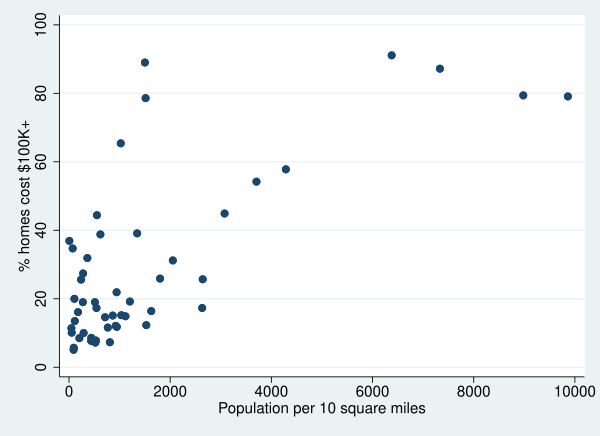

In [2]:
*twoway scatter y_variable x_variable
twoway scatter propval100 popden

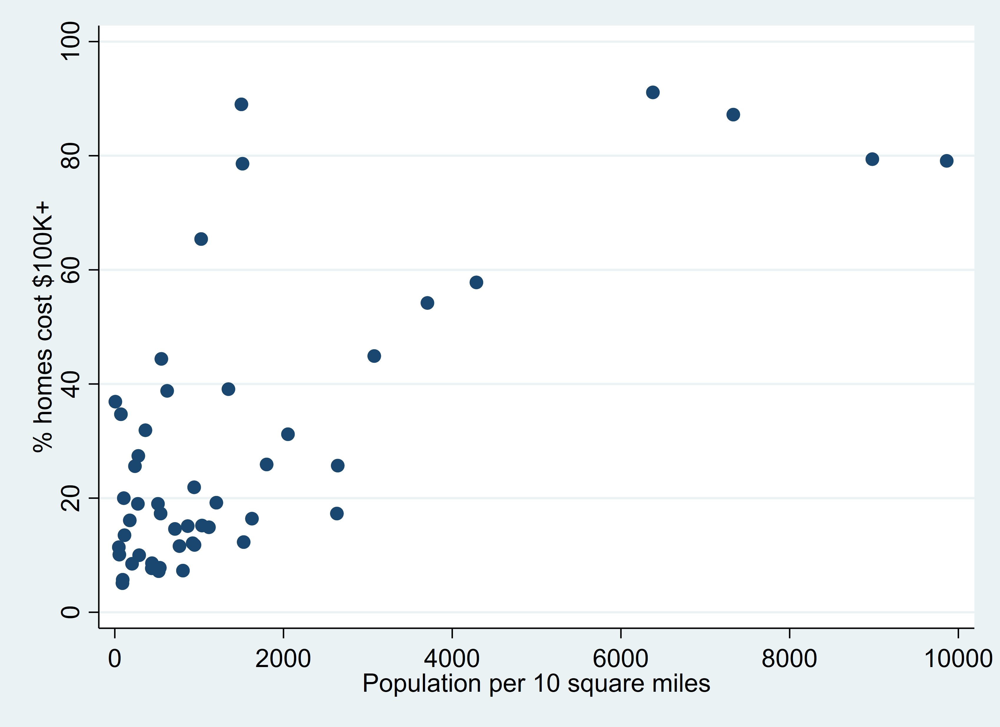

# linear fit
Linear fit will fit a line to the y and x variables

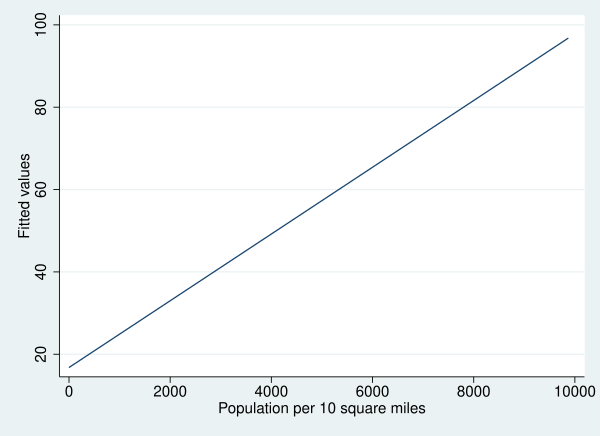

In [3]:
*twoway lfit y_variable x_variable
twoway lfit propval100 popden

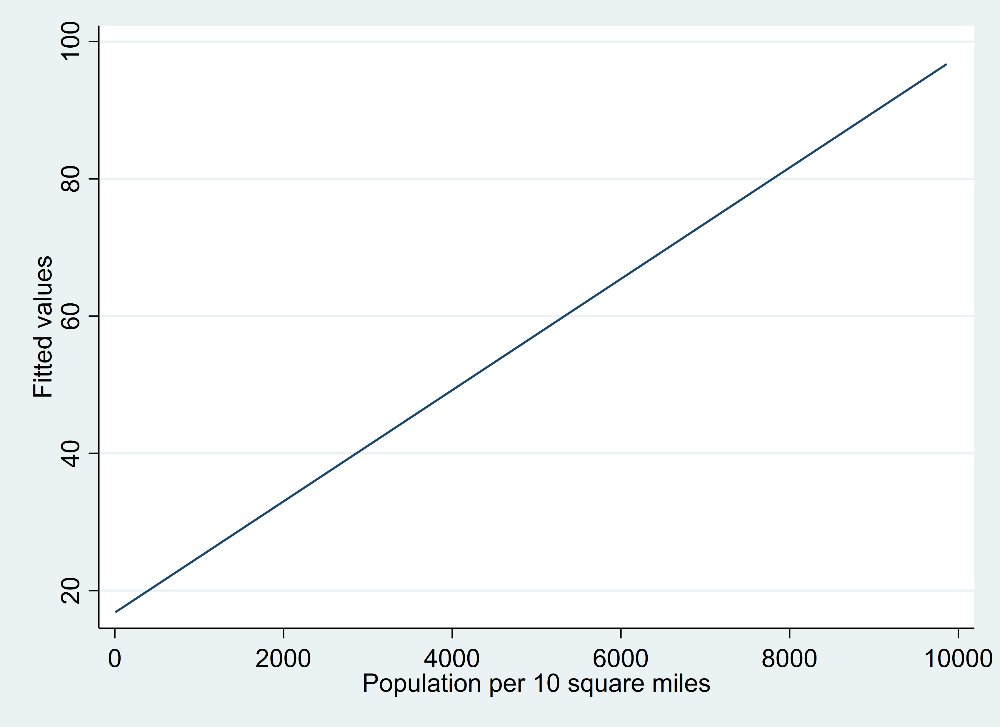

# You can plot both at the same time
You can plot many graphs at the same time with twoway in Stata.

In [ ]:
twoway ///
    (type_of_graph y_variable x_variable) ///
    (type_of_graph y_variable x_variable)

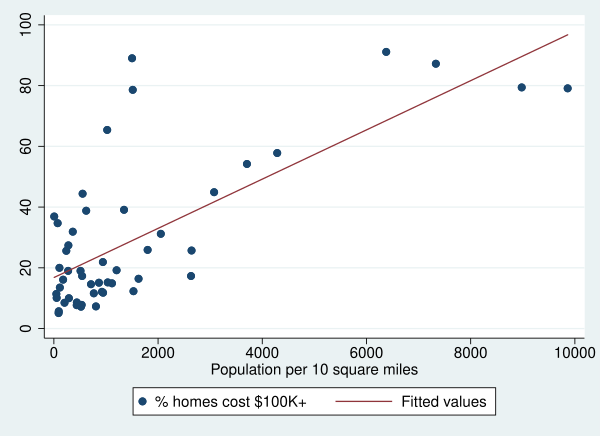

In [11]:
twoway ///
    (scatter propval100 popden) ///
    (lfit propval100 popden)

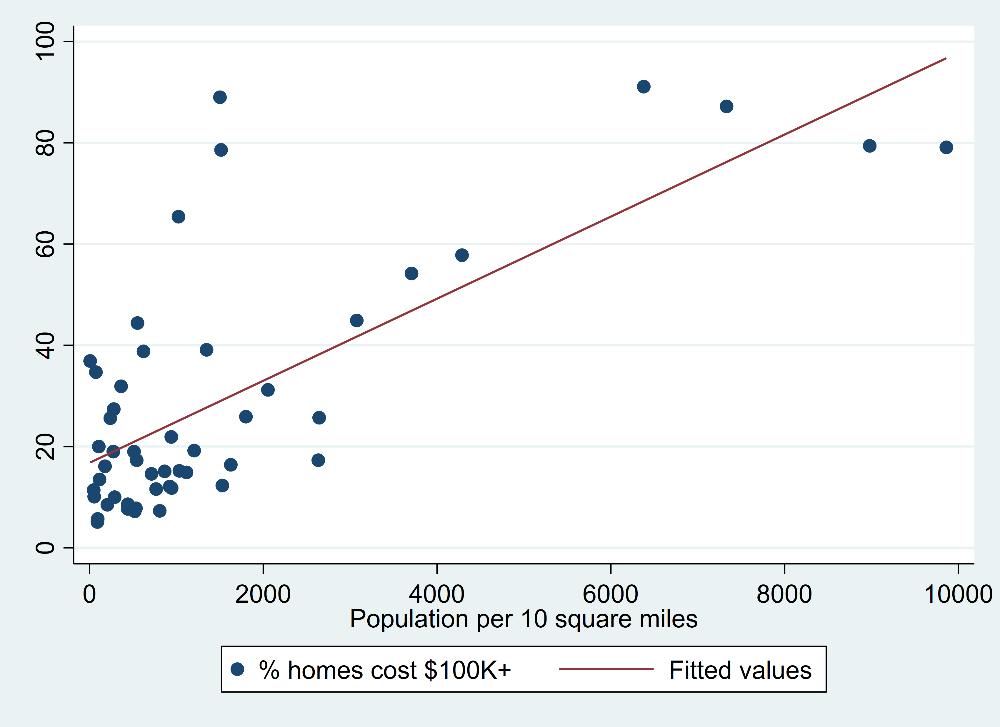

# Quadratic fit
Quadratic fit will make a parabola based on y and x variables

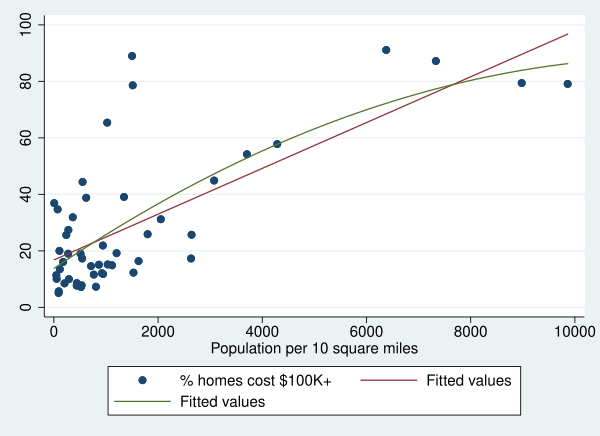

In [12]:
twoway ///
    (scatter propval100 popden) ///
    (lfit propval100 popden) ///
    (qfit propval100 popden)

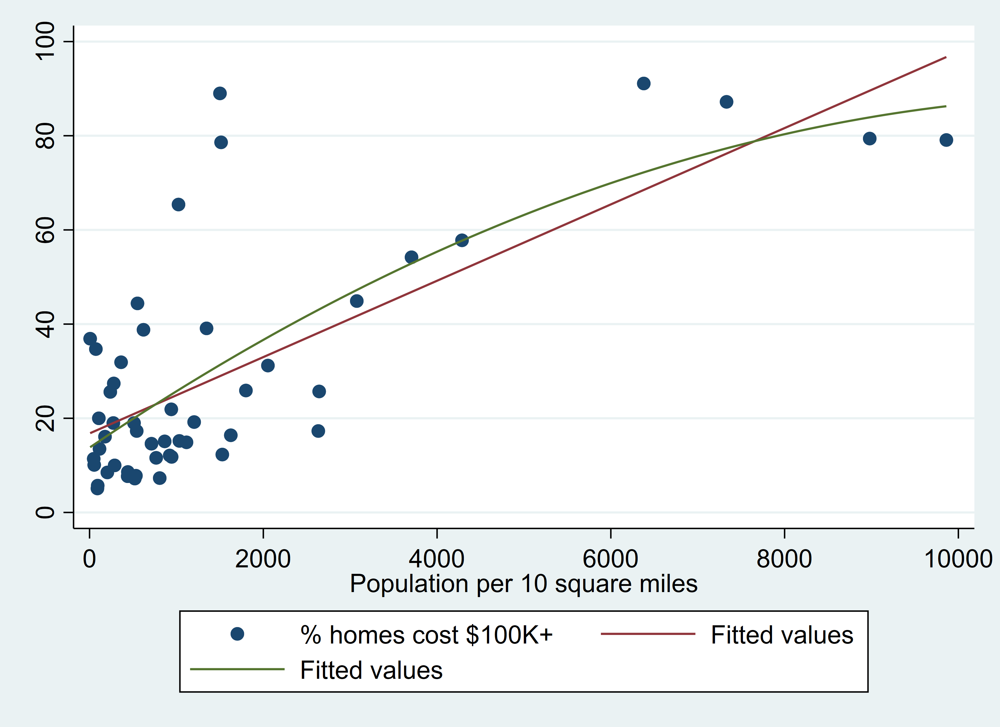

# Confidence interval of linear fit
Sometimes we will want to include confidence intervals to graphs to indicate the reliable over units.

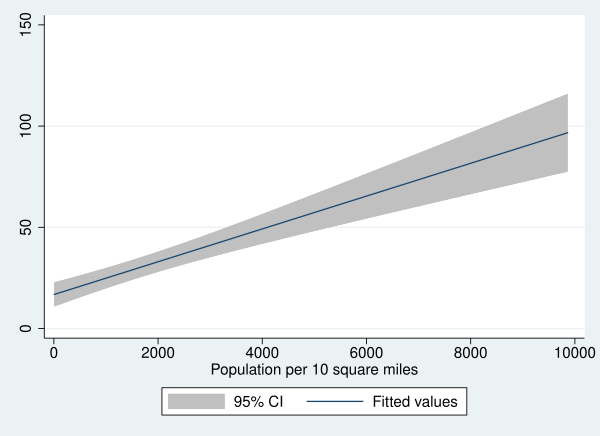

In [13]:
twoway lfitci propval100 popden

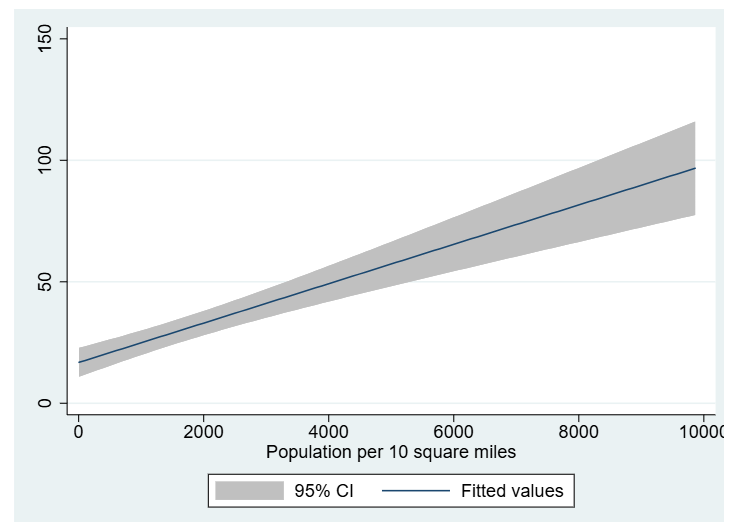

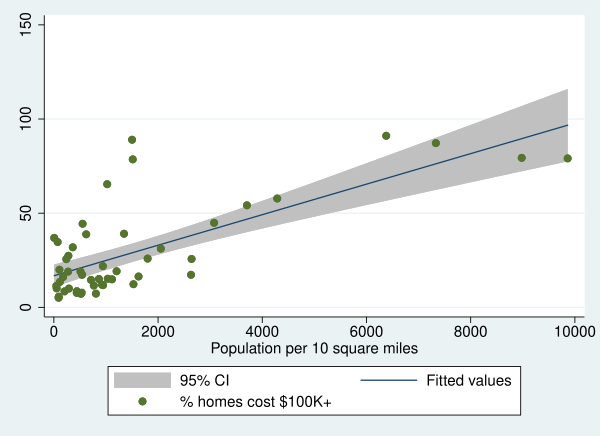

In [15]:
twoway ///
    (lfitci propval100 popden) ///
    (scatter propval100 popden)

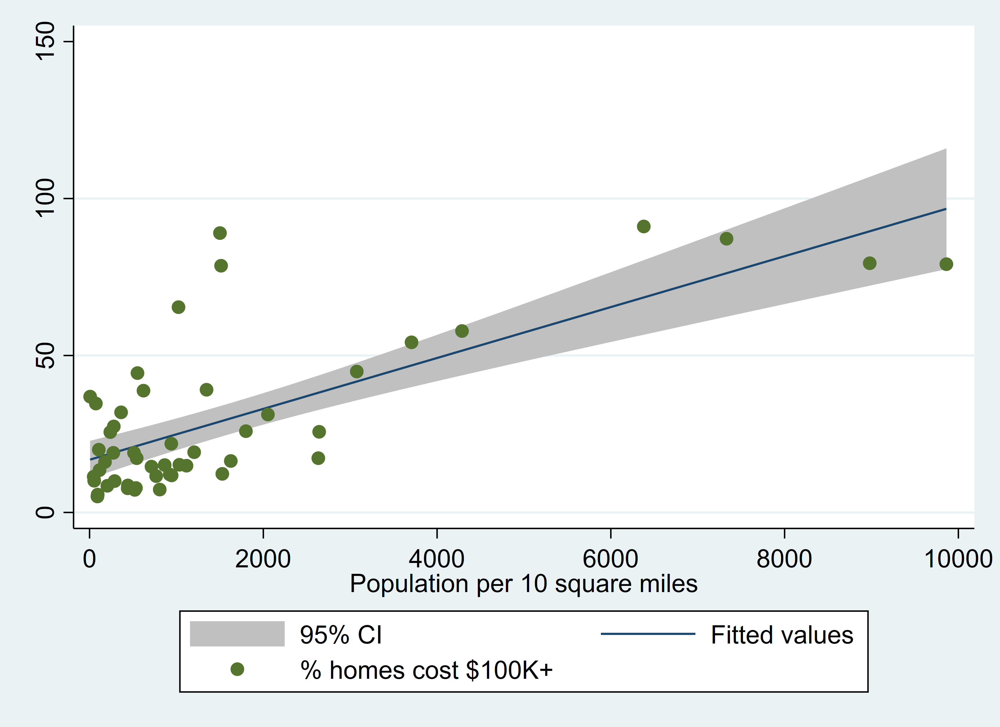

## Matrix graph
Matrix graph shows mutiple scatters at the same time. It can be useful as a initial diagnostics. You use the matrix command with the graph command

In [ ]:
graph matrix variable1 variable2 variable3

In [21]:
corr propval100 rent700 popden

(obs=50)

             | prop~100  rent700   popden
-------------+---------------------------
  propval100 |   1.0000
     rent700 |   0.8784   1.0000
      popden |   0.7250   0.5042   1.0000



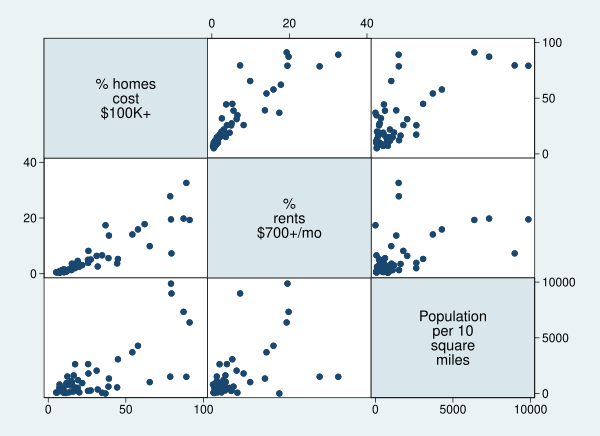

In [22]:
graph matrix propval100 rent700 popden

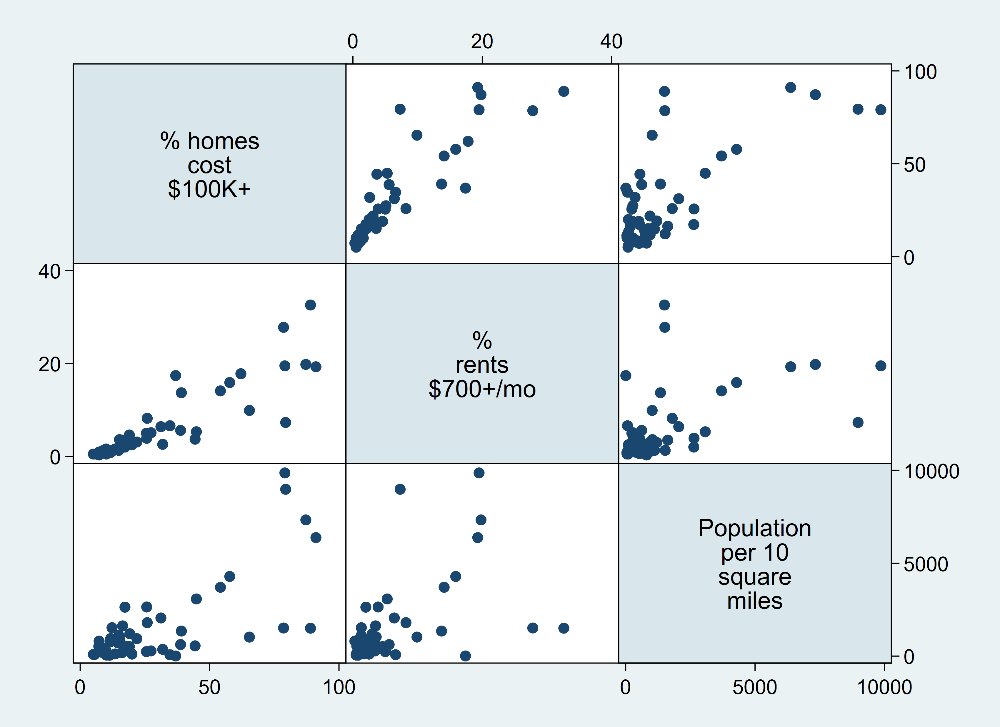

# Histogram
Histogram graphs look at count across variables. Histrogram is special and can be used without twoway because it is looking at distribution across one variable.

(bin=20, start=28.441998, width=.51899681)


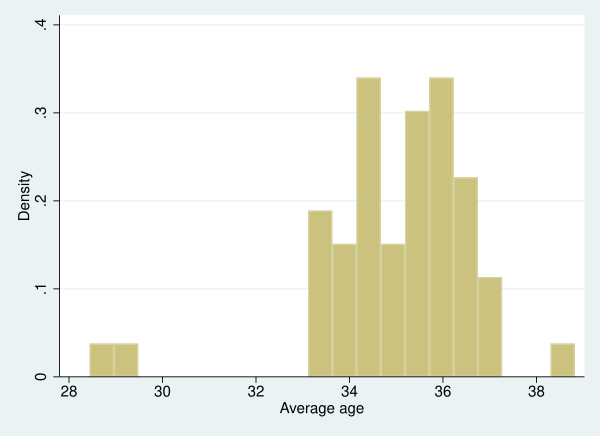

In [4]:
*histogram variable, bin(#)
histogram age, bin(20)

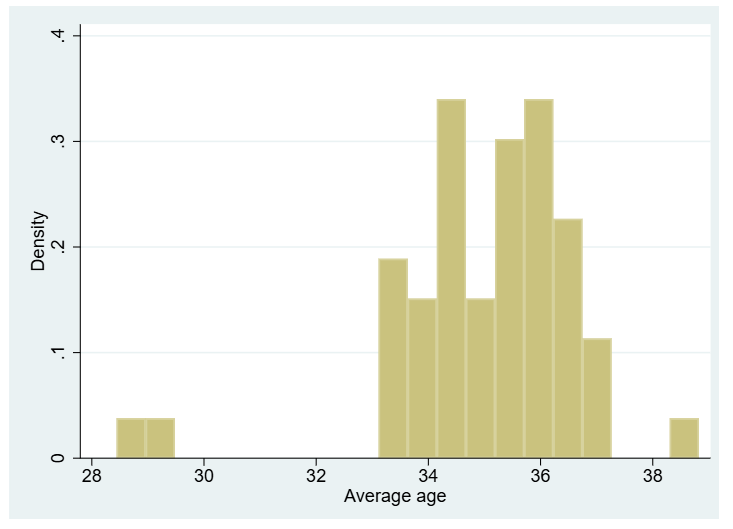

(bin=100, start=28.441998, width=.10379936)


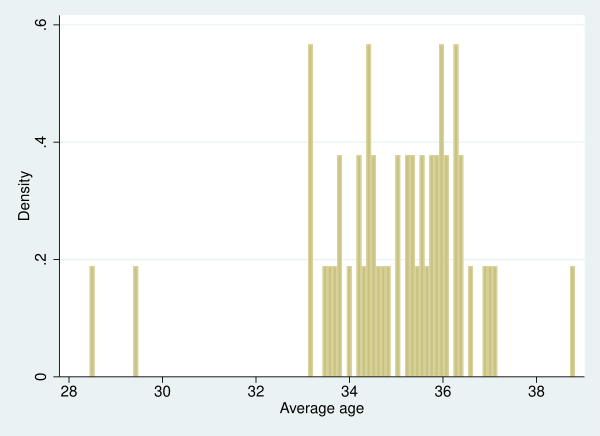

In [5]:
*histogram variable, bin(#)
histogram age, bin(100)

# Bar
Bar graphs uses some number across categories.

In [ ]:
graph bar numerical_variable, ///
    over(categorical_variable)

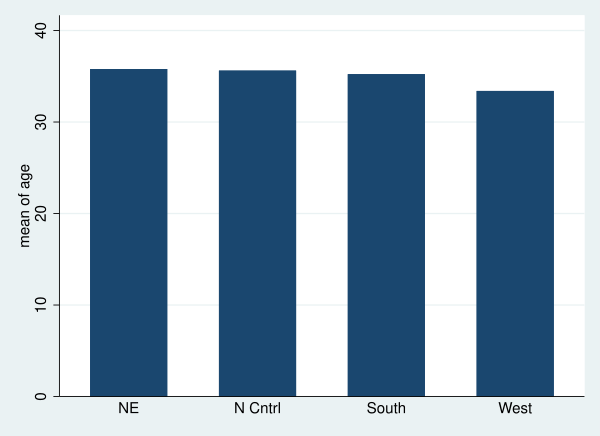

In [23]:
graph bar age, ///
    over(region)

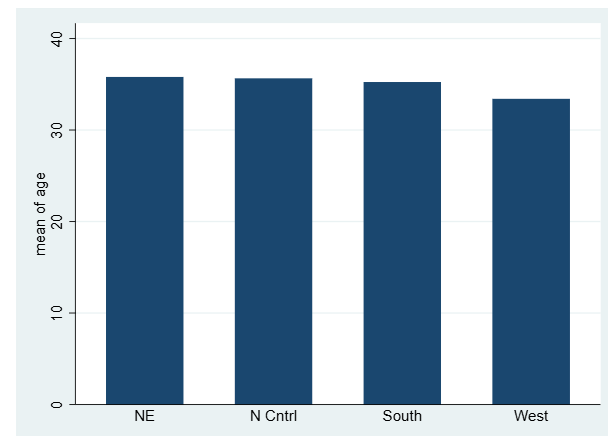

# horizon bar
Horizonal bar graphs

In [ ]:
graph hbar numerical_variable, ///
    over(categorical_variable)

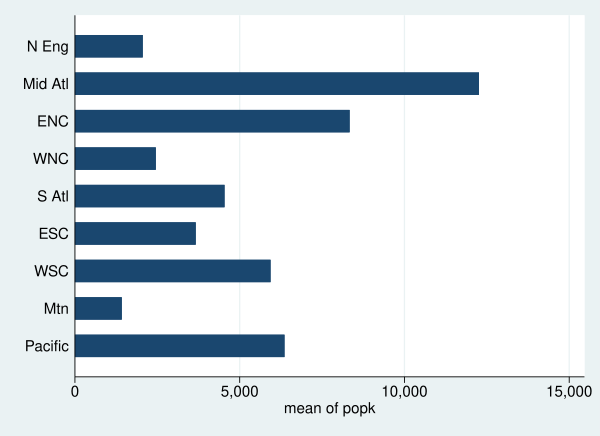

In [24]:
graph hbar popk, ///
    over(division)

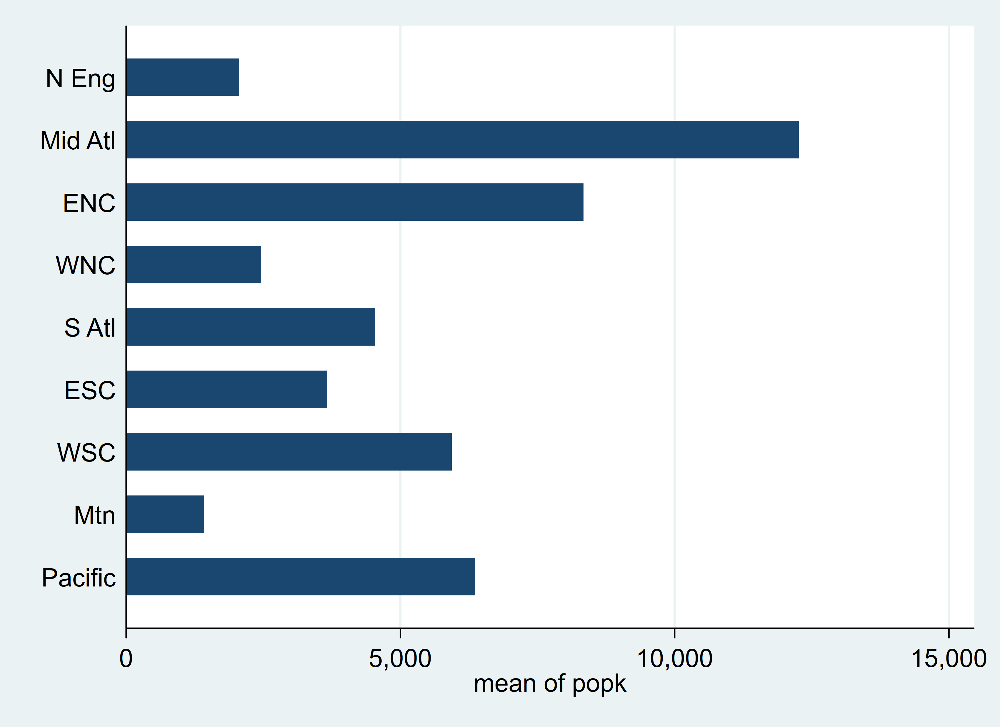

# pie chart over categories
You can also use pie chart and it will make percentages of a numeric variable across categorical variables

In [27]:
graph pie numeric_variable, ///
    over(categorical_variable)

variable numeric_variable not found



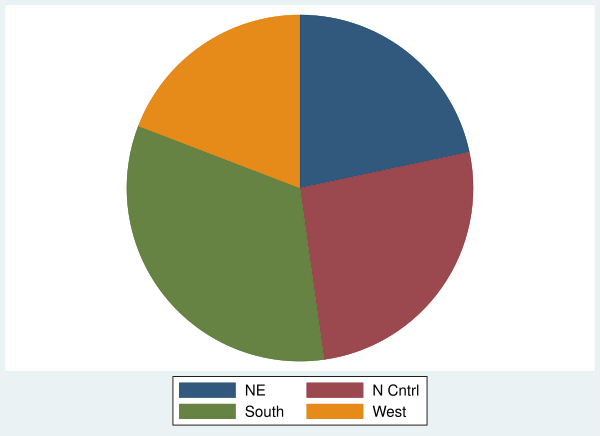

In [29]:
graph pie popk, ///
    over(region)

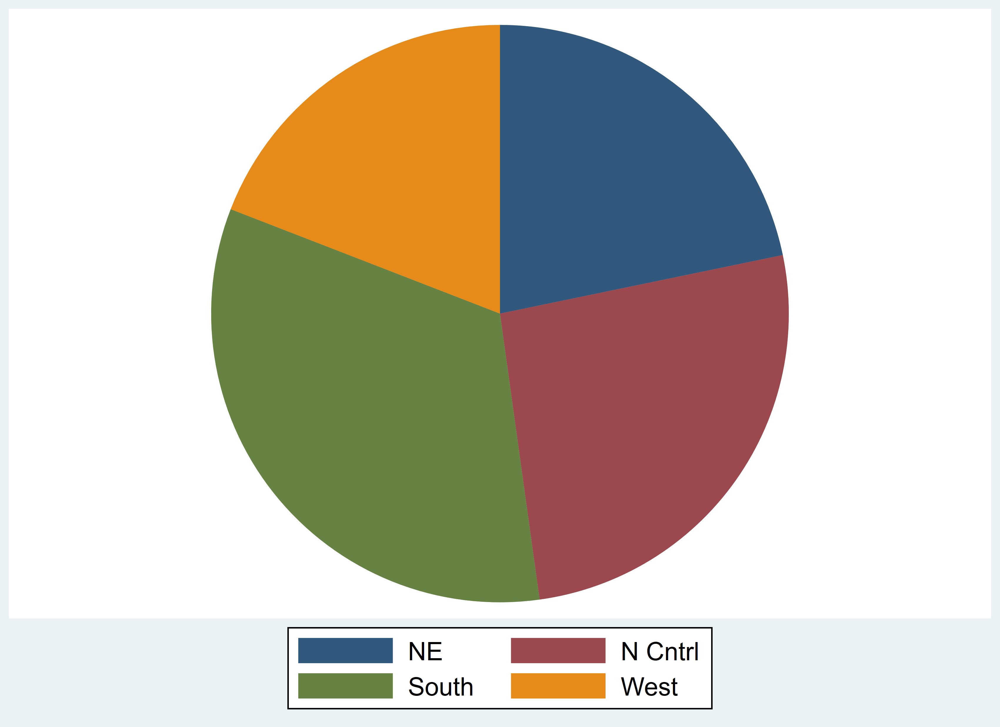

# Different ways to modify Stata twoway
There are many ways to modify the graphs.

## Scheme
Scheme is the format of the graph. You can google all the types. My favorite is scheme(s1mono). A cool verison is scheme(economist)

## Titles
You can edit the titles: title("Title here") --- this is main title; ytitle("Y-axis title") --- this is y-axis title; xtitle("X-axis title") --- this is x-axis

## Marker modifications
Marker modifications usually start with m: mcolor() msymbol() msize()

## Line modifications
Line modifications usually start with l: lcolor() lpattern() lsize()

## Legend
You can modify the legend by legend(1 "Item 1" 2 "Item 2") You can turn off the legend(off)

## Sizing graphs
You can resizing graphs by xsize(4in) ysize(2in)

In [ ]:
*So marker and line modifications go within the parathesis of the graph it refers to. Don't forget the comma
*Larger modification such as scheme, titles, and legend go after the graphs. Don't forget the comma
twoway ///
    (type_of_graph y_variable x_variable, mcolor(blue)) ///
    (type_of_graph y_variable x_variable, lpattern(dash)), ///
    scheme(slmono) ///
    legend(off)

### CO2 emissions and levels of unionization
This study uses examine panel data (1971-2014) of Organization for Economic Cooperation and Development (OECD) countries and whether rates of labor unionization correlate with CO2 emission per capita.

I used a random effects model to estimate this model.

In [6]:
*Let's open the dataset.
use "D:\documents copy\teaching\SOC 206 Spring 2024\week8\co2_data.dta", clear

In [7]:
desc


Contains data from D:\documents copy\teaching\SOC 206 Spring 2024\week8\co2_data
> .dta
  obs:         1,632                          
 vars:            10                          31 Mar 2022 07:55
 size:        81,600                          
--------------------------------------------------------------------------------
              storage   display    value
variable name   type    format     label      variable label
--------------------------------------------------------------------------------
year            int     %8.0g                 
countryname     long    %15.0g     cou        
countrycode     long    %8.0g      couu       
co2pc           double  %10.0g                4 value
gdppc           double  %10.0g                5 value
urb             double  %10.0g                13 value
union_tog       float   %9.0g                 
age_dep         float   %9.0g                 
gdppc_1000      float   %9.0g                 
gdppc_10001     float   %9.0g               

### Let's make a scatter plot of the outcome variable and the MAIN variable of interest

In [ ]:
twoway ///
    (scatter dep_var indep_var, options), ///
    options

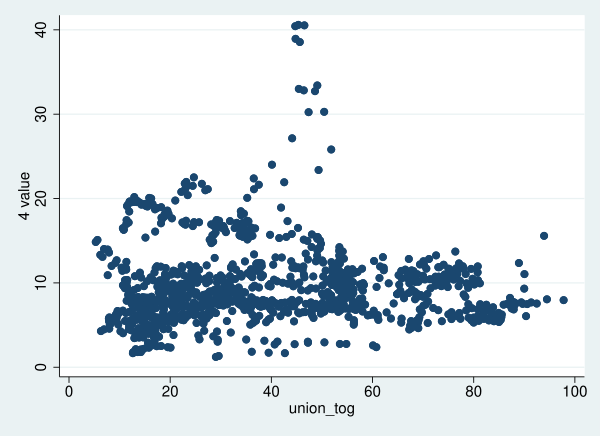

In [7]:
twoway ///
    (scatter co2pc union_tog)

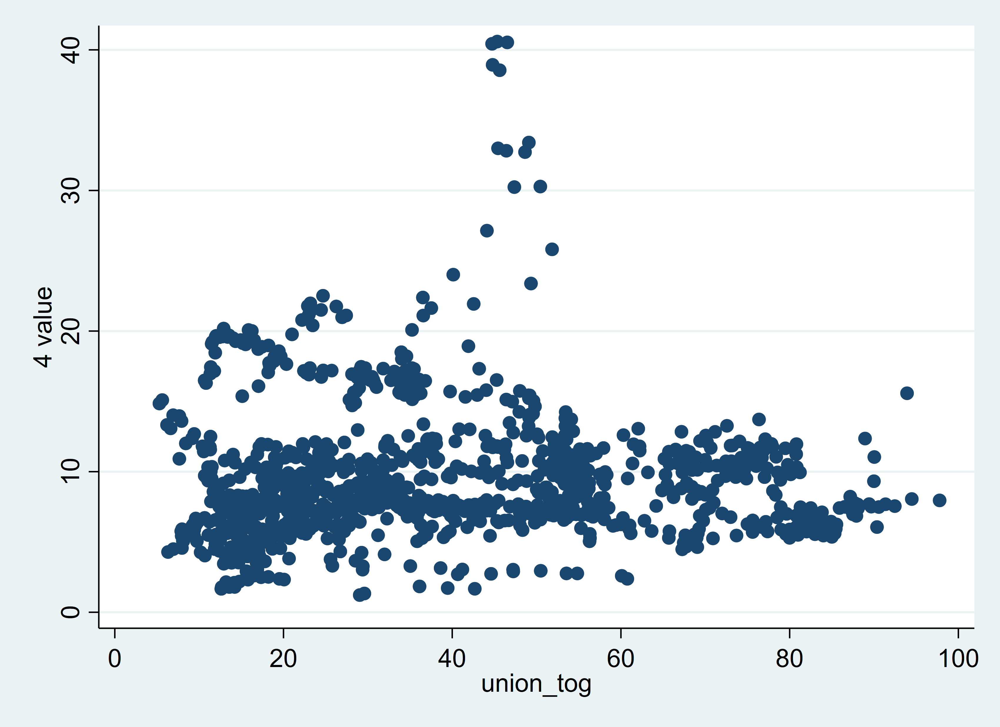

# What would help make this figure better?
* Better x- and y- labels
* Title
* Maybe figuring out who are the "outliers"/stand-outs in the data?
* Maybe plotting the data over time

### axis labels
You can add axis labels in two ways. 

First way---could be to label the variables correctly in Stata...

In [8]:
*Labeling variables in stata
label variable co2pc "CO2 emission per capita"
label variable gdppc "Gross domestic product per capita"
label variable urb "Urbanization (%)"
label variable gdppc_1000 "GDP per capita (in $1,000s)"
label variable gdppc_10001 "GDP per capita (squared)"
label variable age_dep "Age dependency ratio"
label variable union_tog "Union density (%)"

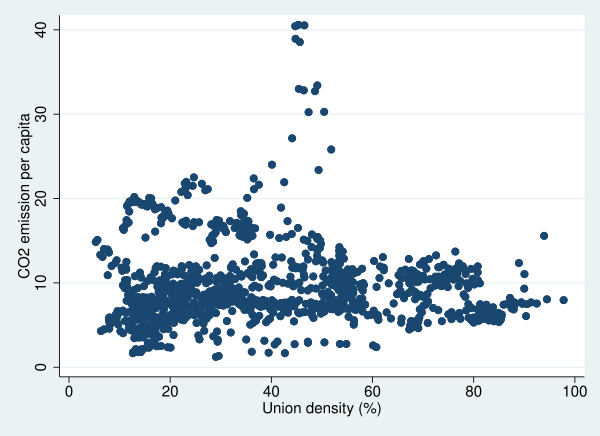

In [9]:
twoway ///
    (scatter co2pc union_tog)

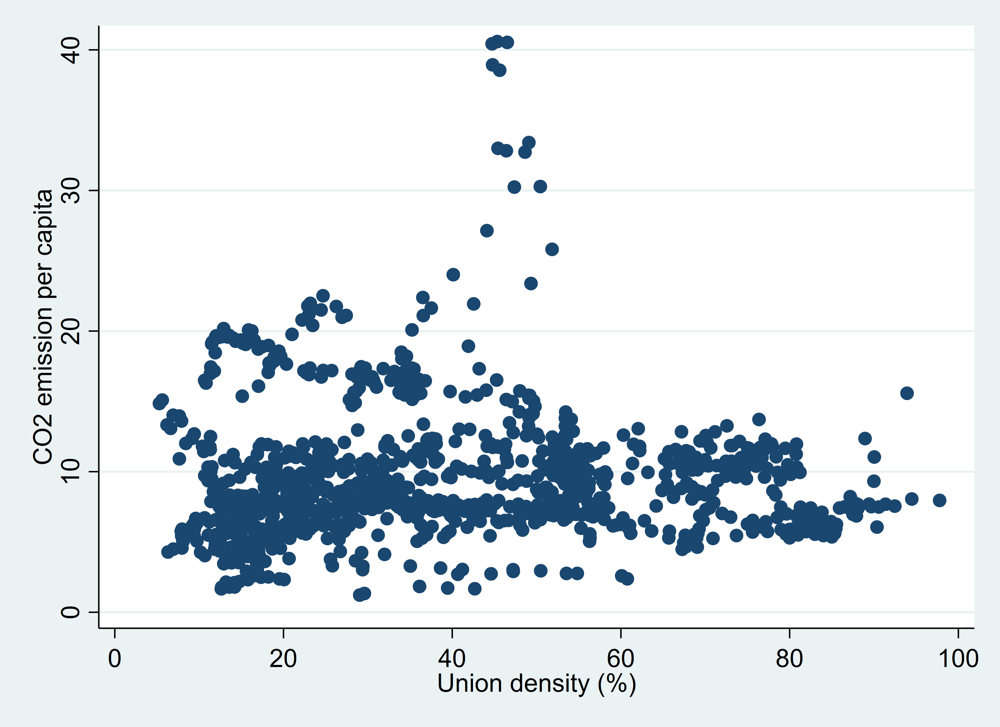

### Way 2 to add axis labels
The second way to add axis labels is to 

In [35]:
twoway ///
    (scatter co2pc union_tog), ///
    title("Scatterplot of union density and CO2 per capita" ///
    ytitle("CO2 emission in metric tons per capita") ///
    xtitle("% of Union Density")

parentheses do not balance



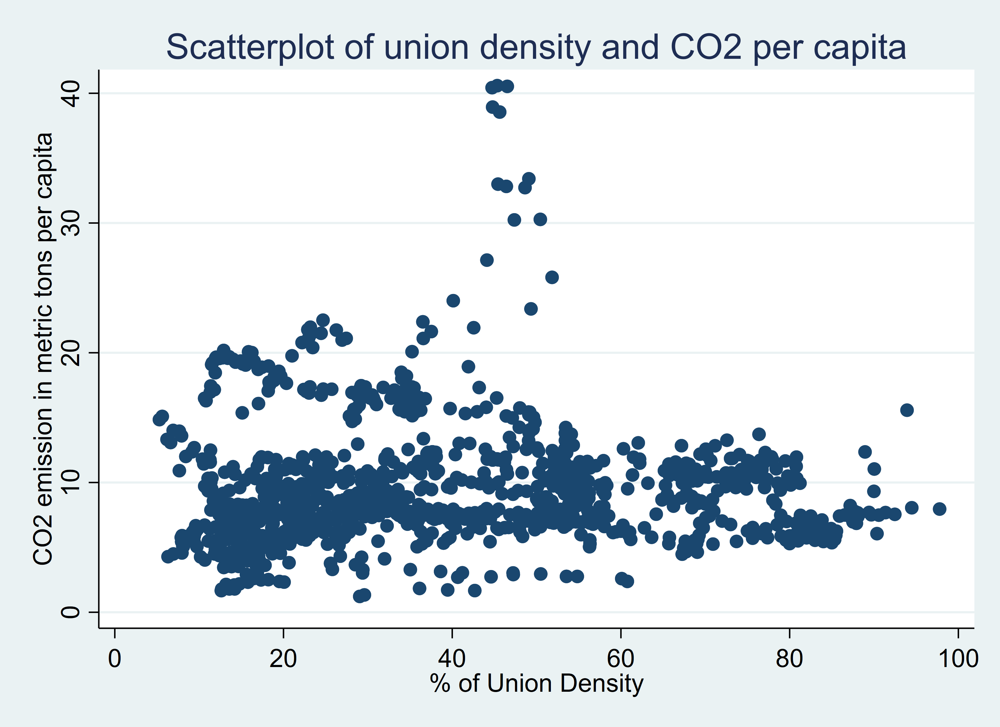

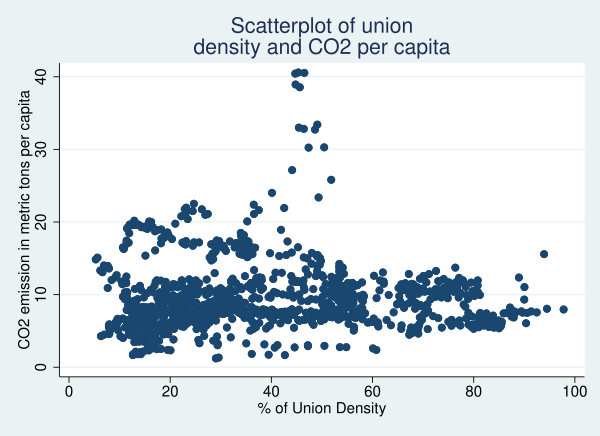

In [11]:
twoway ///
    (scatter co2pc union_tog), ///
    title("Scatterplot of union" "density and CO2 per capita") ///
    ytitle("CO2 emission in metric tons per capita") ///
    xtitle("% of Union Density")

### Modifying the axes
You can put different sizes into Stata like tiny, small, medium, large, huge.

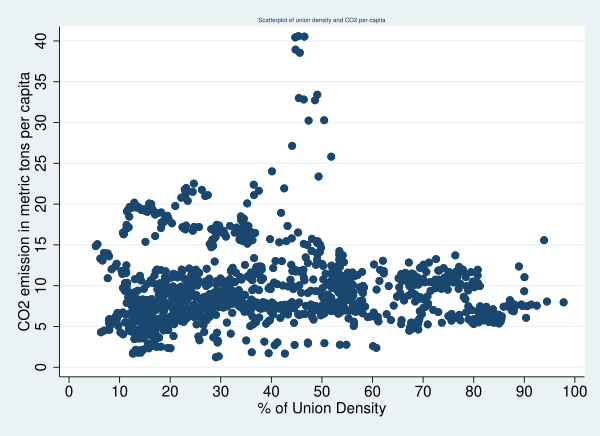

In [36]:
scatter co2pc union_tog, ///
    title("Scatterplot of union density and CO2 per capita", size(tiny)) ///
    ytitle("CO2 emission in metric tons per capita") ///
    xtitle("% of Union Density") ///
    ylabel(0(5)40) ///
    xlabel(0(10)100)

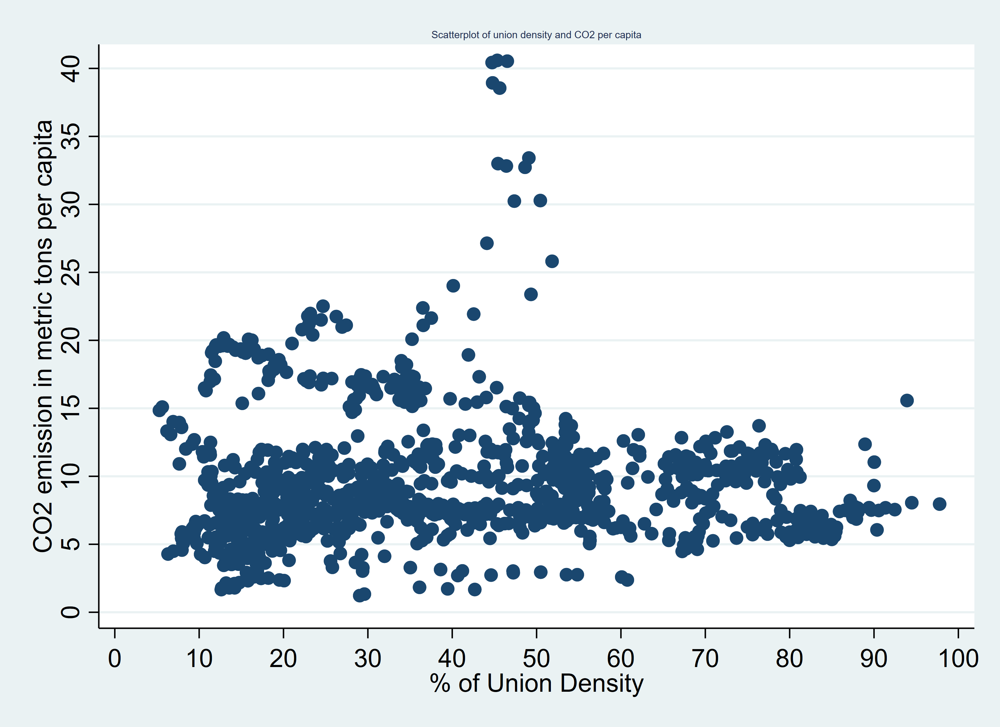

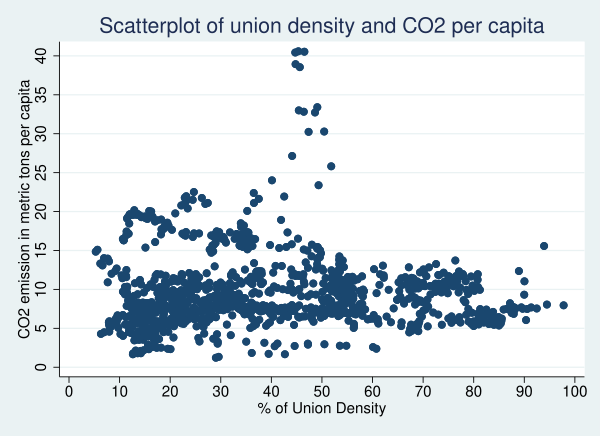

In [12]:
scatter co2pc union_tog, ///
    title("Scatterplot of union density and CO2 per capita", size(large)) ///
    ytitle("CO2 emission in metric tons per capita") ///
    xtitle("% of Union Density") ///
    ylabel(0(5)40) ///
    xlabel(0(10)100)

### Modufying symbols of the scatter plot
See here for more information about symbols: https://www.stata.com/manuals/g-3marker_options.pdf

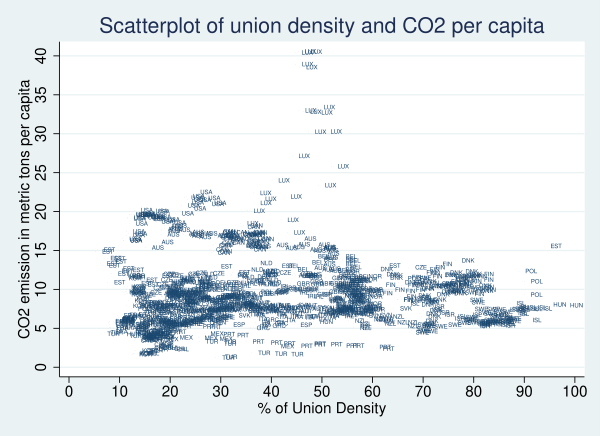

In [13]:
twoway ///
    (scatter co2pc union_tog, msymbol(point) mlabel(countrycode) mlabsize(tiny)), ///
    title("Scatterplot of union density and CO2 per capita", size(large)) ///
    ytitle("CO2 emission in metric tons per capita") ///
    xtitle("% of Union Density") ///
    ylabel(0(5)40) ///
    xlabel(0(10)100)

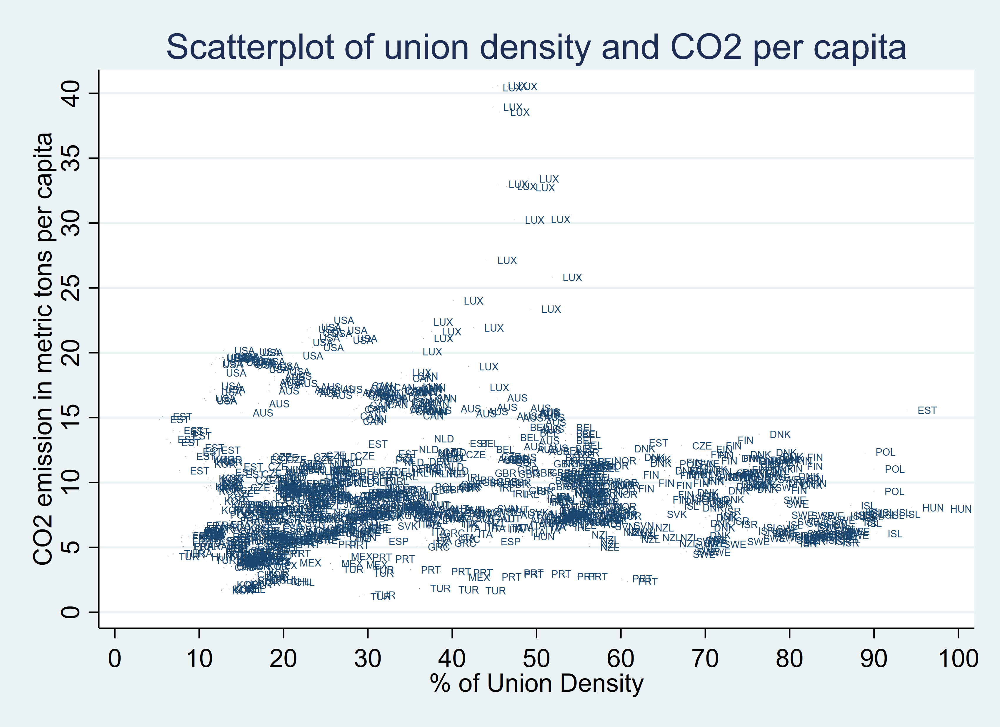


(note:  named style smcirle not found in class symbol, default attributes
    used)
(note:  named style smcirle not found in class symbol, default attributes
    used)
(note:  named style smcirle not found in class symbol, default attributes
    used)
(note:  named style smcirle not found in class symbol, default attributes
    used)
(note:  named style craberry not found in class color, default attributes
    used)
(note:  named style craberry not found in class color, default attributes
    used)
(note:  named style smcirle not found in class symbol, default attributes
    used)
(note:  named style smcirle not found in class symbol, default attributes
    used)
(note:  named style lightblue not found in class color, default attributes
    used)
(note:  named style lightblue not found in class color, default attributes
    used)
(note:  named style smcirle not found in class symbol, default attributes
    used)
(note:  named style smcirle not found in class symbol, default attributes

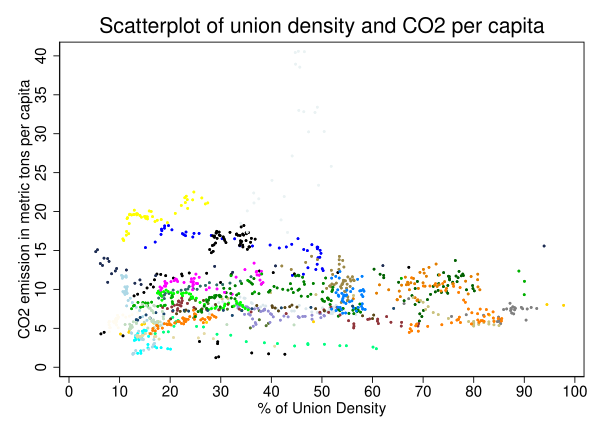



(note: file scatter_bycountry.png not found)
(file scatter_bycountry.png written in PNG format)


In [39]:
twoway (scatter co2pc union_tog if countryname==1, msymbol(smcirle) msize(tiny) mcolor(blue)) ///
    (scatter co2pc union_tog if countryname==2, msymbol(smcirle) msize(tiny) mcolor(bluishgray)) ///
    (scatter co2pc union_tog if countryname==3, msymbol(smcirle) msize(tiny) mcolor(brown)) ///
    (scatter co2pc union_tog if countryname==4, msymbol(smcirle) msize(tiny) mcolor(craberry)) ///
    (scatter co2pc union_tog if countryname==5, msymbol(smcirle) msize(tiny) mcolor(cyan)) ///
    (scatter co2pc union_tog if countryname==6, msymbol(smcirle) msize(tiny) mcolor(lightblue)) ///
    (scatter co2pc union_tog if countryname==7, msymbol(smcirle) msize(tiny) mcolor(dkgreen)) ///
    (scatter co2pc union_tog if countryname==8, msymbol(smcirle) msize(tiny) mcolor(dknavy)) ///
    (scatter co2pc union_tog if countryname==9, msymbol(smcirle) msize(tiny) mcolor(dkorange)) ///
    (scatter co2pc union_tog if countryname==10, msymbol(smcirle) msize(tiny) mcolor(eggshell)) ///
    (scatter co2pc union_tog if countryname==11, msymbol(smcirle) msize(tiny) mcolor(emerald)) ///
    (scatter co2pc union_tog if countryname==12, msymbol(smcirle) msize(tiny) mcolor(forest_green)) ///
    (scatter co2pc union_tog if countryname==13, msymbol(smcirle) msize(tiny) mcolor(gold)) ///
    (scatter co2pc union_tog if countryname==14, msymbol(smcirle) msize(tiny) mcolor(gray)) ///
    (scatter co2pc union_tog if countryname==15, msymbol(smcirle) msize(tiny) mcolor(green)) ///
    (scatter co2pc union_tog if countryname==16, msymbol(smcirle) msize(tiny) mcolor(khaki)) ///
    (scatter co2pc union_tog if countryname==17, msymbol(smcirle) msize(tiny) mcolor(lavender)) ///
    (scatter co2pc union_tog if countryname==18, msymbol(smcirle) msize(tiny) mcolor(lime)) ///
    (scatter co2pc union_tog if countryname==19, msymbol(smcirle) msize(tiny) mcolor(ltblue)) ///
    (scatter co2pc union_tog if countryname==20, msymbol(smcirle) msize(tiny) mcolor(ltbluishgray)) ///
    (scatter co2pc union_tog if countryname==21, msymbol(smcirle) msize(tiny) mcolor(ltkhaki)) ///
    (scatter co2pc union_tog if countryname==22, msymbol(smcirle) msize(tiny) mcolor(magenta)) ///
    (scatter co2pc union_tog if countryname==23, msymbol(smcirle) msize(tiny) mcolor(maroon)) ///
    (scatter co2pc union_tog if countryname==24, msymbol(smcirle) msize(tiny) mcolor(midblue)) ///
    (scatter co2pc union_tog if countryname==25, msymbol(smcirle) msize(tiny) mcolor(midgreen)) ///
    (scatter co2pc union_tog if countryname==26, msymbol(smcirle) msize(tiny) mcolor(mint)) ///
    (scatter co2pc union_tog if countryname==27, msymbol(smcirle) msize(tiny) mcolor(navy)) ///
    (scatter co2pc union_tog if countryname==28, msymbol(smcirle) msize(tiny) mcolor(olive)) ///
    (scatter co2pc union_tog if countryname==29, msymbol(smcirle) msize(tiny) mcolor(olive_teal)) ///
    (scatter co2pc union_tog if countryname==30, msymbol(smcirle) msize(tiny) mcolor(orange)) ///
    (scatter co2pc union_tog if countryname==31, msymbol(smcirle) msize(tiny) mcolor(orange)) ///
    (scatter co2pc union_tog if countryname==32, msymbol(smcirle) msize(tiny) mcolor(black)) ///
    (scatter co2pc union_tog if countryname==33, msymbol(smcirle) msize(tiny) mcolor(green)) ///
    (scatter co2pc union_tog if countryname==34, msymbol(smcirle) msize(tiny) mcolor(yellow)), ///
    title("Scatterplot of union density and CO2 per capita", size(large)) ///
    ytitle("CO2 emission in metric tons per capita") ///
    xtitle("% of Union Density") ///
    ylabel(0(5)40) ///
    xlabel(0(10)100) ///
    scheme(s1mono) ///
    legend(off) 
graph export "scatter_bycountry.png", replace width(3400)

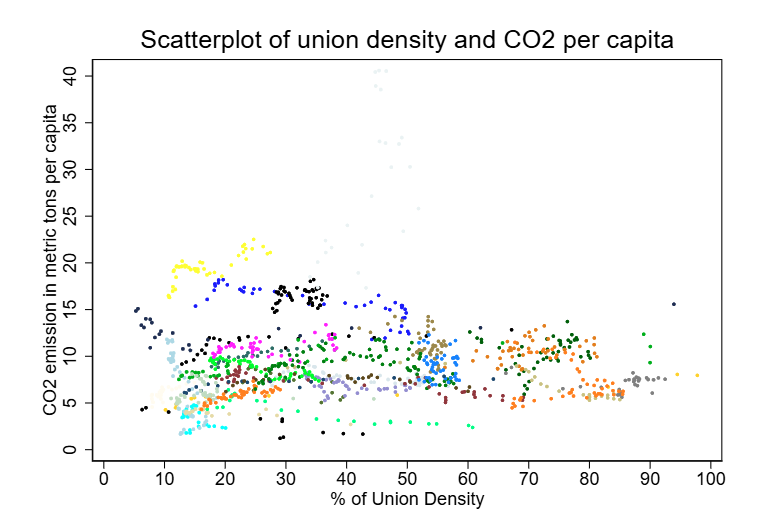

## One limitation of this kind of graph is it has TOO MUCH information.
Sometimes your have to simplify your data to make a graph more accessible. Here the collapse tool is very helpful.

First, we can calculate the average union rates by year for the data.

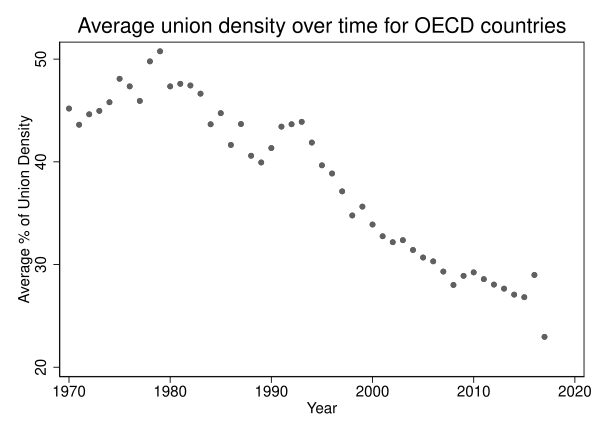

In [14]:
use "D:\documents copy\teaching\SOC 206 Spring 2024\week8\co2_data.dta", clear

*This just collapses the data to make a general graphs of CO2 emissions and unionization
collapse (mean) co2pc union_tog, by(year)

twoway ///
    (scatter union_tog year, msize(small)), ///
    title("Average union density over time for OECD countries", size(large)) ///
    ytitle("Average % of Union Density") ///
    xtitle("Year") ///
    scheme(s1mono) ///
    legend(off) 

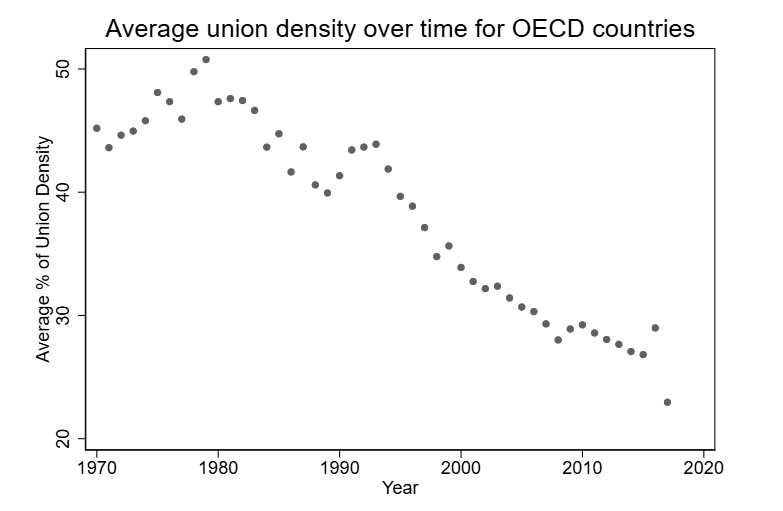

Second, we can calculate averages for each country.

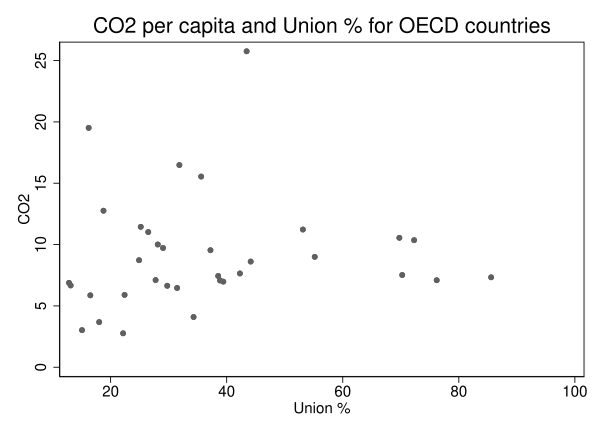

In [20]:
use "D:\documents copy\teaching\SOC 206 Spring 2024\week8\co2_data.dta", clear

*This just collapses the data to make a general graphs of CO2 emissions and unionization
collapse (mean) co2pc union_tog, by(countryname)

twoway ///
    (scatter co2pc union_tog, msize(small)), ///
    title("CO2 per capita and Union % for OECD countries", size(large)) ///
    ytitle("CO2") ///
    xtitle("Union %") ///
    scheme(s1mono) ///
    legend(off) 

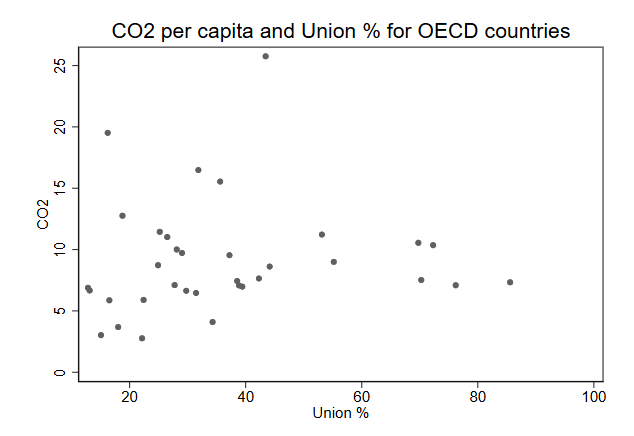

A trick to make a graph more useful is to add important text to the graph, for example let's add the US as reference and point out a possible outlier.

In [47]:
tab countryname


    countryname |      Freq.     Percent        Cum.
----------------+-----------------------------------
      Australia |          1        2.94        2.94
        Austria |          1        2.94        5.88
        Belgium |          1        2.94        8.82
         Canada |          1        2.94       11.76
          Chile |          1        2.94       14.71
 Czech Republic |          1        2.94       17.65
        Denmark |          1        2.94       20.59
        Estonia |          1        2.94       23.53
        Finland |          1        2.94       26.47
         France |          1        2.94       29.41
        Germany |          1        2.94       32.35
         Greece |          1        2.94       35.29
        Hungary |          1        2.94       38.24
        Iceland |          1        2.94       41.18
        Ireland |          1        2.94       44.12
         Israel |          1        2.94       47.06
          Italy |          1        2.94     

In [54]:
list if co2pc>20
list if countryname==34



     +-----------------------------------+
     | countryn~e       co2pc   union_~g |
     |-----------------------------------|
 20. | Luxembourg   25.756697   43.43877 |
     +-----------------------------------+


     +--------------------------------------+
     |   countryname       co2pc   union_~g |
     |--------------------------------------|
 34. | United States   19.513911    16.2219 |
     +--------------------------------------+


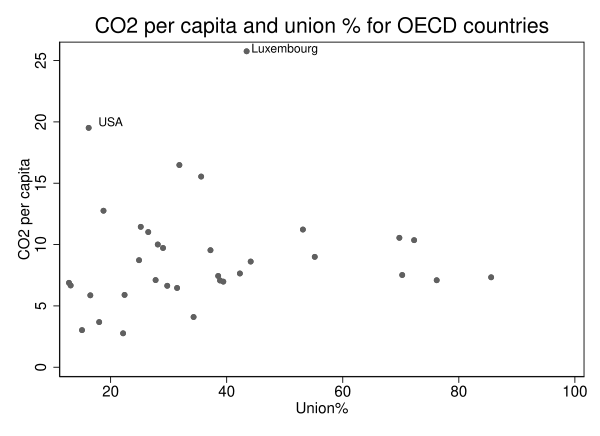

In [21]:
use "D:\documents copy\teaching\SOC 206 Spring 2024\week8\co2_data.dta", clear

*This just collapses the data to make a general graphs of CO2 emissions and unionization
collapse (mean) co2pc union_tog, by(countryname)

twoway ///
    (scatter co2pc union_tog, msize(small)), ///
    text(26 50 "Luxembourg", size(small)) ///
    text(20 20 "USA", size(small)) ///
    title("CO2 per capita and union % for OECD countries", size(large)) ///
    ytitle("CO2 per capita") ///
    xtitle("Union%") ///
    scheme(s1mono) ///
    legend(off) 

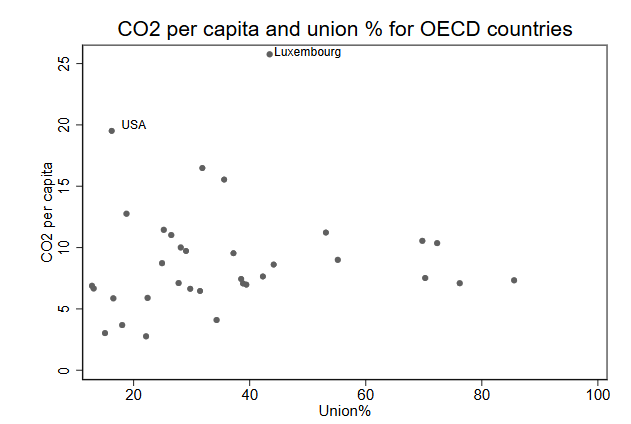

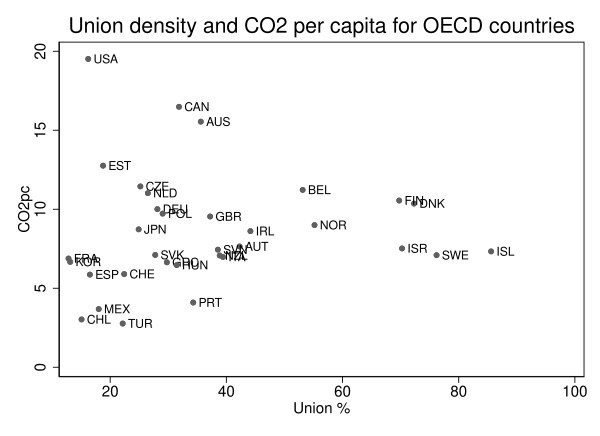

In [22]:
use "D:\documents copy\teaching\SOC 206 Spring 2024\week8\co2_data.dta", clear

*This just collapses the data to make a general graphs of CO2 emissions and unionization
collapse (mean) co2pc union_tog, by(countryname countrycode)

twoway ///
    (scatter co2pc union_tog if countrycode!=23, msize(small) mlabel(countrycode) mlabsize(small) mlabposition(3)), ///
    title("Union density and CO2 per capita for OECD countries", size(large)) ///
    ytitle("CO2pc") ///
    xtitle("Union %") ///
    scheme(s1mono) ///
    legend(off) 

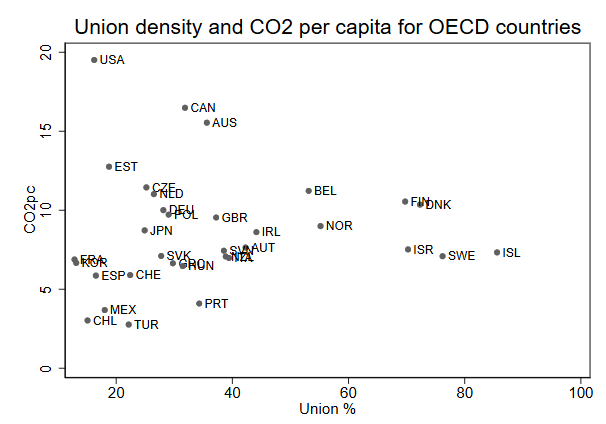

# Coefficient plots
Coefficient plots are way to display data from tables. The "coefplot" command must be ran after a regression. This works for any regression including logistic regression

In [86]:
*download coefplot
ssc install coefplot

checking coefplot consistency and verifying not already installed...
installing into c:\ado\plus\...
installation complete.


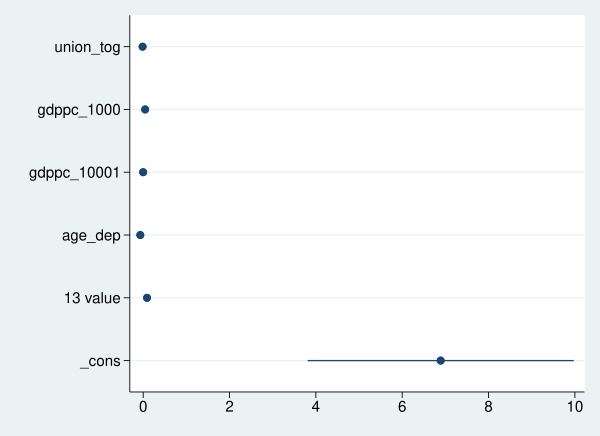

In [19]:
use "D:\documents copy\teaching\SOC 206 Spring 2024\week8\co2_data.dta", clear

quietly mixed co2pc union_tog gdppc_1000 gdppc_10001 age_dep urb|| countryname:
coefplot

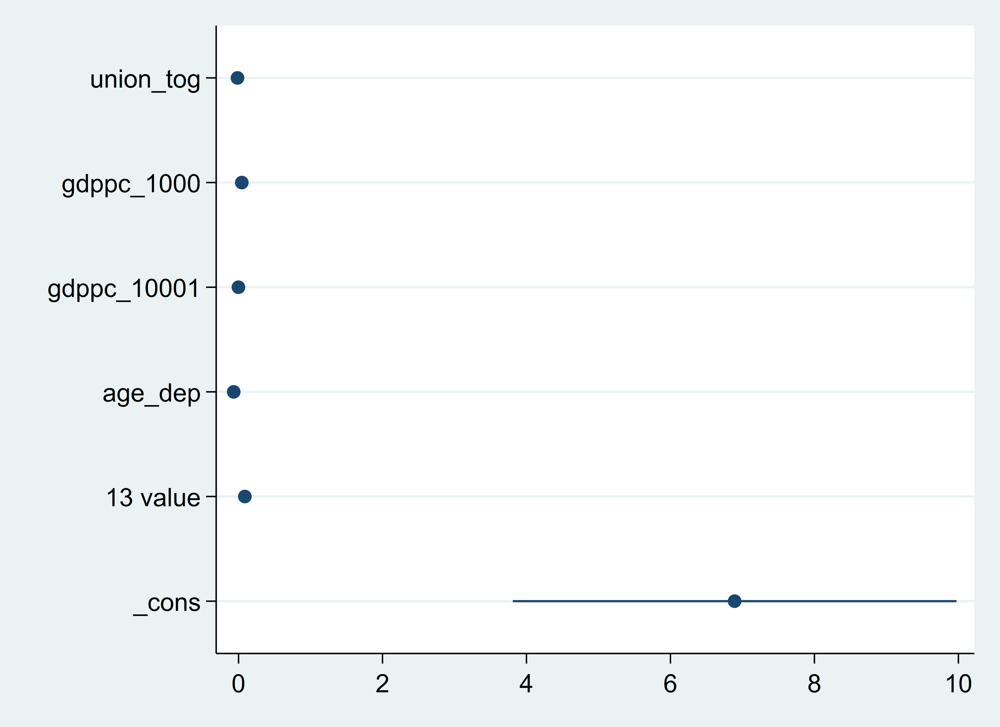



Performing EM optimization: 

Performing gradient-based optimization: 

Iteration 0:   log likelihood = -2186.7963  
Iteration 1:   log likelihood = -2186.7963  

Computing standard errors:

Mixed-effects ML regression                     Number of obs     =      1,148
Group variable: countryname                     Number of groups  =         34

                                                Obs per group:
                                                              min =         11
                                                              avg =       33.8
                                                              max =         45

                                                Wald chi2(5)      =     457.33
Log likelihood = -2186.7963                     Prob > chi2       =     0.0000

------------------------------------------------------------------------------
       co2pc |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+----------------

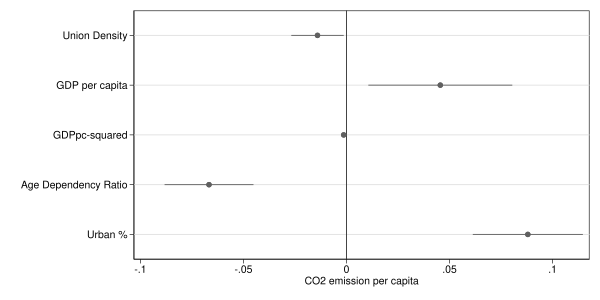

In [89]:
mixed co2pc union_tog gdppc_1000 gdppc_10001 age_dep urb|| countryname:
coefplot, drop(_cons) xline(0) ///
    coeflabels(union_tog="Union Density" gdppc_1000="GDP per capita" ///
    gdppc_10001="GDPpc-squared" age_dep="Age Dependency Ratio" urb="Urban %") ///
    xtitle(CO2 emission per capita) ///
    xsize(8) ///
    scheme(s1mono)

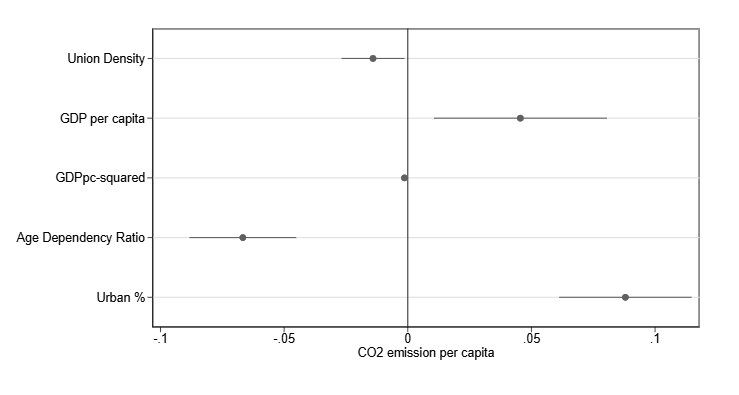

# Caterpillar graph
If you using panel or multi-level models, you can make second-level graphs caterpillar graphs.




Performing EM optimization: 

Performing gradient-based optimization: 

Iteration 0:   log likelihood = -2930.6299  
Iteration 1:   log likelihood = -2930.6299  

Computing standard errors:

Mixed-effects ML regression                     Number of obs     =      1,421
Group variable: countryname                     Number of groups  =         34

                                                Obs per group:
                                                              min =         23
                                                              avg =       41.8
                                                              max =         45

                                                Wald chi2(0)      =          .
Log likelihood = -2930.6299                     Prob > chi2       =          .

------------------------------------------------------------------------------
       co2pc |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+---------------

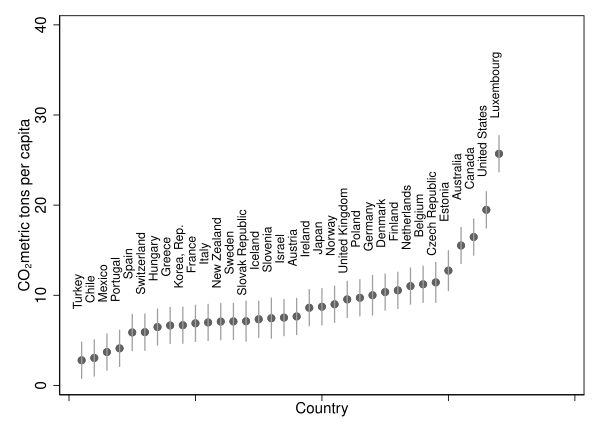






(file D:\documents copy\teaching\SOC 206 Spring 2024\week8\caterpillar_exp_value
> _co2.png written in PNG format)


In [22]:
use "D:\documents copy\teaching\SOC 206 Spring 2024\week8\co2_data.dta", clear

*null model in order to make a country level visual of CO2 emissions
mixed co2pc || countryname:

*This makes the predicted values with country-specific clusters
predict co2_fixed, fitted
*This makes the standard error for the fixed part predicted values 
predict co2_fixed_se, stdp
*This estimates the random part of country and time
predict u0, reffects
*This calculates the standard errors of the random part
predict u0_se, reses

*calculates 95% confidence interval (1.96se) and adds the standard error of both fixed and random
gen totse=(co2_fixed_se+u0_se)*1.96
*calculating the lower 95% CI bound
gen explo=co2_fixed-totse
*calculating the upper 95% CI bound
gen exphi=co2_fixed+totse

*The following three lines must be ran together.
sort countryname
by countryname: gen selectfromlist= (_n==1)
*to check if code worked
sort selectfromlist

*These set of commands only keeps country-level data.
keep if selectfromlist==1

sort co2_fixed
gen plot=_n

twoway ///
    (scatter co2_fixed plot, mlabel(countryname) mlabposition(12) mlabangle(90) mlabgap(15)) ///
    (rspike exphi explo plot), ///
    ytitle("CO{subscript:2} metric tons per capita") ///
    xtitle("Country") ///
    ylabel(0(10)40) ///
    xlabel(, nolabels) ///
    legend(off) ///
    scheme(s1mono)
graph export "D:\documents copy\teaching\SOC 206 Spring 2024\week8\caterpillar_exp_value_co2.png", replace width(3400)

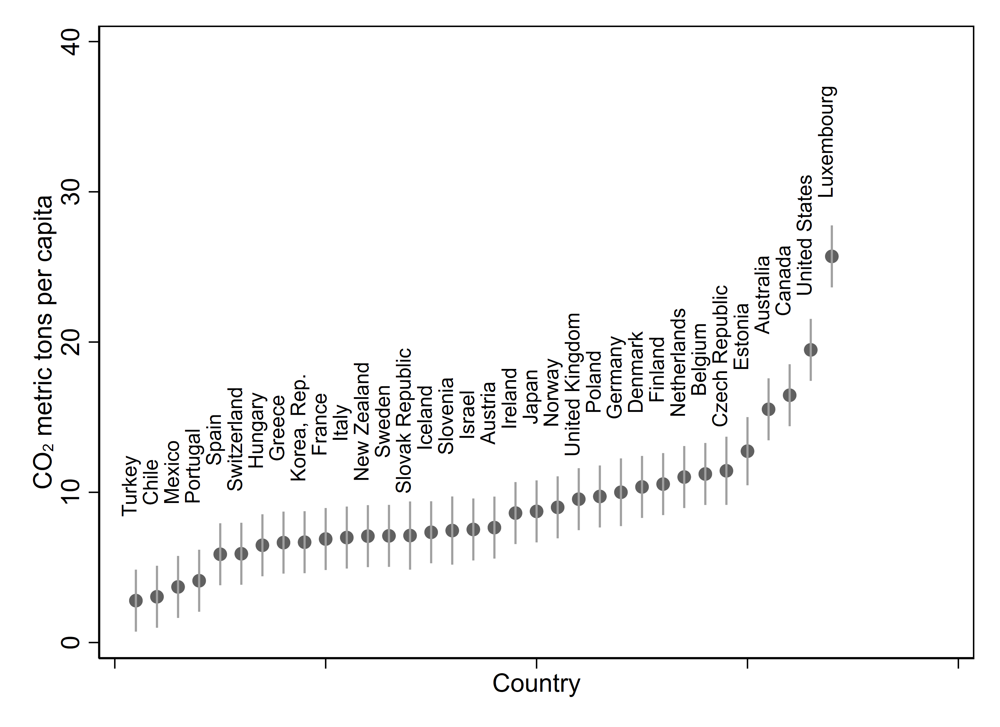

# Marginal plots are excellent visualization tool, but make sure to clean them

In [90]:
mixed co2pc union_tog gdppc_1000 gdppc_10001 age_dep urb || countryname:


Performing EM optimization: 

Performing gradient-based optimization: 

Iteration 0:   log likelihood = -2186.7963  
Iteration 1:   log likelihood = -2186.7963  

Computing standard errors:

Mixed-effects ML regression                     Number of obs     =      1,148
Group variable: countryname                     Number of groups  =         34

                                                Obs per group:
                                                              min =         11
                                                              avg =       33.8
                                                              max =         45

                                                Wald chi2(5)      =     457.33
Log likelihood = -2186.7963                     Prob > chi2       =     0.0000

------------------------------------------------------------------------------
       co2pc |      Coef.   Std. Err.      z    P>|z|     [95% Conf. Interval]
-------------+-----------------

In [91]:
summ co2pc union_tog gdppc_1000 gdppc_10001 age_dep urb


    Variable |        Obs        Mean    Std. Dev.       Min        Max
-------------+---------------------------------------------------------
       co2pc |      1,421    9.083848    5.042202   1.222604   40.58952
   union_tog |      1,264    37.78427    21.95614   4.486948   97.77778
  gdppc_1000 |      1,463    31.20348    18.88368   1.815018   111.9684
 gdppc_10001 |      1,463    1330.007    1705.583   3.294289   12536.91
     age_dep |      1,632    53.19106    8.560601    36.3229   101.3013
-------------+---------------------------------------------------------
         urb |      1,632    73.49405    12.44912     37.004     97.934




Adjusted predictions                            Number of obs     =      1,148

Expression   : Linear prediction, fixed portion, predict()

1._at        : union_tog       =           0
               gdppc_1000      =    32.31853 (mean)
               gdppc_10001     =    1342.358 (mean)
               age_dep         =    51.93605 (mean)
               urb             =    75.24374 (mean)

2._at        : union_tog       =          25
               gdppc_1000      =    32.31853 (mean)
               gdppc_10001     =    1342.358 (mean)
               age_dep         =    51.93605 (mean)
               urb             =    75.24374 (mean)

3._at        : union_tog       =          50
               gdppc_1000      =    32.31853 (mean)
               gdppc_10001     =    1342.358 (mean)
               age_dep         =    51.93605 (mean)
               urb             =    75.24374 (mean)

4._at        : union_tog       =          75
               gdppc_1000      =    32.31853 (mean)

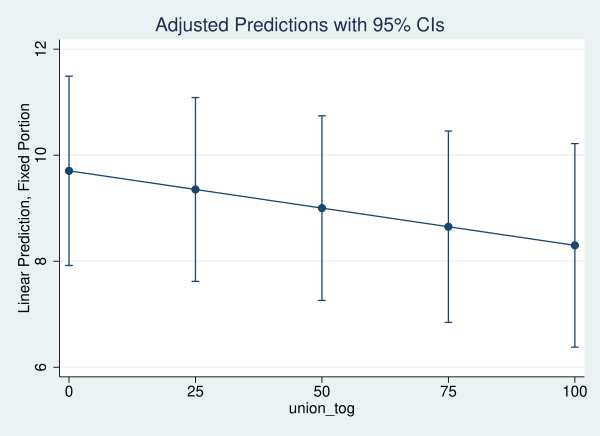

In [97]:
*This will estimate unionization levels on CO2 per capita emissions holding everything at average.
margins , at(union_tog=(0(25)100)) atmeans
marginsplot


  Variables that uniquely identify margins: union_tog


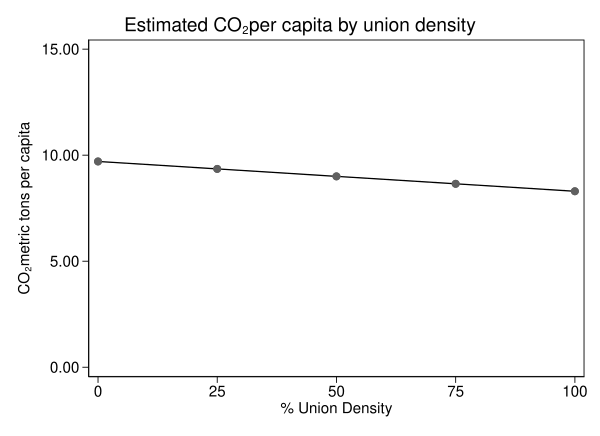

In [101]:
marginsplot, ///
    noci /// no confidence intervals
    ytitle("CO{subscript:2} metric tons per capita") ///
    xtitle("% Union Density") ///
    ylabel(0 5 10 15, angle(horizontal) format(%9.2f)) ///
    title("Estimated CO{subscript:2} per capita by union density") ///
    legend (off) ///
    scheme(s1mono)

We see that a 25% increase in union density leads to roughly .35 decrease in CO2 metric tons per capita. One CO2 metric ton is equal to driving a car for three months. 

# Practice Problem #1
* Use NHANES data and make bar chart reporting average BMI across sex and race. Make sure to include the confidence intervals (95%). Make sure to sure label everything. Here is a set-up for the problem...

In [31]:
use "https://www.stata-press.com/data/r17/nhanes2.dta", clear
codebook bmi race sex




--------------------------------------------------------------------------------
bmi                                                        Body mass index (BMI)
--------------------------------------------------------------------------------

                  Type: Numeric (float)

                 Range: [12.385596,61.129696]         Units: 1.000e-07
         Unique values: 9,941                     Missing .: 0/10,351

                  Mean: 25.5376
             Std. dev.: 4.91497

           Percentiles:     10%       25%       50%       75%       90%
                        20.1037    22.142   24.8181   28.0267   31.7259

--------------------------------------------------------------------------------
race                                                                        Race
--------------------------------------------------------------------------------

                  Type: Numeric (byte)
                 Label: race

                 Range: [1,3]                  

# Practice Problem #2
Using the CO2 data (from earlier in the lecture) make a scatter plot of CO2 emission per capita and GDP per capita. Make sure to include a label for the x-axis, y-axis, and main title. Once you make one scatter plot. Then, make another graph using the twoway command to include a scatter plot, linear fit, and quardratic fit of the CO2 and GDP.
Here is a set-up for the problem...

In [ ]:
use "co2_data.dta",clear